# Modeling Avalanches



**Each phase of the process:**
1. [Business understanding](#Businessunderstanding)
    1. [Assess the Current Situation](#Assessthecurrentsituation)
        1. [Inventory of resources](#Inventory)
        2. [Requirements, assumptions and constraints](#Requirements)
        3. [Terminology](#Terminology)
        4. [Costs and benefits](#CostBenefit)
    2. [What are the Desired Outputs](#Desiredoutputs)
    3. [What Questions Are We Trying to Answer?](#QA)
2. [Data Understanding](#Dataunderstanding)
    1. [Initial Data Report](#Datareport)
    2. [Data Description](#Datadescription)
    3. [Initial Data Exploration](#Exploredata) 
    4. [Verify Data Quality](#Verifydataquality)
        1. [Missing Data](#MissingData) 
        2. [Outliers](#Outliers) 
    5. [Data Quality Report](#Dataqualityreport)
3. [Data Preparation](#Datapreparation)
    1. [Select Your Data](#Selectyourdata)
    2. [Cleanse the Data](#Cleansethedata)
        1. [Label Encoding](#labelEncoding)
        2. [Drop Unnecessary Columns](#DropCols)
        3. [Altering Datatypes](#AlteringDatatypes)
        4. [Dealing With Zeros](#DealingZeros)
    3. [Construct Required Data](#Constructrequireddata)
    4. [Integrate Data](#Integratedata)
4. [Exploratory Data Analysis](#EDA)
5. [Modelling](#Modelling)
    1. [Modelling Technique](#ModellingTechnique)
    2. [Modelling Assumptions](#ModellingAssumptions)
    3. [Build Model](#BuildModel)
    4. [Assess Model](#AssessModel)
6. [Evaluation](#Evaluation)
7. [Deployment](#Deployment)

https://www.sv-europe.com/crisp-dm-methodology/


# 1. Stage One - Understanding the Goal for the Project <a class="anchor" id="Businessunderstanding"></a>

The goal of this project is to find commonalities in the factors that lead to avalanches in the Canadian backcountry. This involved scraping the Avalanche Canada website for all recorded incidents or avalanche sightings. This dataset contains approximately 4,000 records of people witnessing avalanches in the backcountry and recording the factors involved in those avalanches.

### I have two major goals for this project:
1. **Make this data more accessible to the general public.**  
   People submit these reports of avalanches to the Mountain Information Network (MIN), which is great for short-term understanding as people read about recent incidents. However, it does not allow for long-term trends to be observed, which could help people better understand the factors leading to avalanches.
   
2. **Create a model to identify commonalities.**  
   By using factors gathered in the reports, weather data, and forecasts, I aim to model these avalanches. This model will allow people to get feedback on their decisions to go into the backcountry based on years of historical data that is otherwise inaccessible.

## 1.1 Assess the Current Situation<a class="anchor" id="Assessthecurrentsituation"></a>

This involves more detailed fact-finding about all of the resources, constraints, assumptions and other factors that you'll need to consider when determining your data analysis goal and project plan. 


### 1.1.1 Inventory of Resources <a class="anchor" id="Inventory"></a>
List of resources available to the project:
- **Personnel**: Just me.
- **Data**: Currently hosted locally on a MySQL database.
- **Computing Resources**: Lenovo Mobile Workstation.
- **Software**: 
  - Python for data scraping and analysis.
  - MySQL for database hosting.
  - GitHub for version control.
  - React.js for visualization and dashboard creation.
  - Scikit-learn for machine learning.

### 1.1.2 Requirements, Assumptions, and Constraints <a class="anchor" id="Requirements"></a>
- **Team Size**: Only one person working on the project in spare time.
- **Data Quality**: Some avalanches are well-documented, while others are not, making data cleanliness a real concern, especially since decisions in the backcountry can be life-or-death.
- **Model Risks**: There are legitimate concerns about misleading or bad data leading to poor outputs, which may influence decisions. Extreme caution is necessary when using this model.
- **Data Accuracy**: I have to assume that the data recorded by the public is largely accurate, as there is no way to verify where the avalanche occurred.
- **Data Volume**: Limited to 4,000 reports from 2016 to the present. Removing too much data is constrained by the small dataset size.
- **One Class**: There are only reports of avalanches that occured not ones that didn't. Thus I will have to build a predicitive model from only one type of occurance with no easy way to test it. This may require generating synthetic data using my knowledge of what I think makes a very unlikely avalanche. 

### 1.1.3 Terminology <a class="anchor" id="Terminology"></a>
# Avalanche Glossary

| Term | Definition |
|------|------------|
| **Aspect** | The direction a slope faces with respect to sun and wind. For instance, a slope may be north-facing, or it may be a leeward slope. |
| **Anchors** | Trees, rocks, or bushes that help hold the snowpack in place. |
| **Avalanche Air Bag** | A backpack device that inflates to help a person stay near the surface of an avalanche. |
| **Avalung™** | A breathing device that helps delay suffocation by directing exhaled CO₂ behind the body. |
| **Beacon** | An electronic device used to locate buried avalanche victims. Also called transceivers. |
| **Bed Surface** | The snow surface on which an avalanche slides. |
| **Bridging** | A stiff slab can distribute weight over a wider area, decreasing the chance of triggering a weak layer. |
| **Cirque** | A large bowl-shaped depression formed by glacial erosion. |
| **Climax Slab Avalanche** | An avalanche involving the entire season’s snowpack, sliding on a deep weak layer. |
| **Clustered Snow** | See *melt freeze snow*. |
| **Collapsing ("Whoomphing")** | Sudden collapse of a weak snow layer; a strong sign of instability. |
| **Concave Slope** | A slope that becomes less steep as you descend. |
| **Continental Climate** | Snow climate far from oceans; thin snowpack, cold temperatures, persistent weak layers. |
| **Convex Slope** | A slope that becomes steeper as you descend. |
| **Corn Snow** | See *melt freeze snow*. |
| **Cornice** | An overhanging mass of snow formed by wind, typically along ridgelines. |
| **Couloir** | A steep, narrow gully in alpine terrain. |
| **Cross Loaded** | Snow blown across a slope by wind, often forming dangerous drifts. |
| **Crown** | The snow remaining above the top fracture line of a slab avalanche. |
| **Crown Face** | The exposed vertical face at the top of a slab avalanche. |
| **Deep Slab Avalanche** | A large avalanche breaking on deep, persistent weak layers. |
| **Delayed Action Avalanche** | Avalanche occurring hours or days after the trigger event (e.g., storm). |
| **Depth Hoar** | Weak, sugary snow crystals formed near the ground due to temperature gradients. |
| **Direct Action Avalanche** | Avalanches triggered immediately by snowfall, wind-loading, or rain. |
| **Diurnal Recrystallization** | Faceted snow created by daily freeze/thaw temperature gradients. |
| **Equilibrium** | A well-bonded snowpack with low temperature gradients. |
| **Faceted Snow** | Angular snow crystals with poor bonding, created by strong temperature gradients. |
| **Firn** | Old, compacted snow on its way to becoming glacial ice. |
| **Flagged Trees** | Trees with branches missing on one side, typically uphill-facing—evidence of past avalanches. |
| **Fracture** | The failure of a weak layer that results in an avalanche. |
| **Fracture Line** | The outline of the initial break in a slab avalanche. |
| **Glide** | Whole snowpack slowly sliding over the ground, sometimes releasing catastrophically. |
| **Grain** | Individual snow crystals visible in the snowpack. |
| **Graupel** | Small, round pellets of snow resembling Styrofoam. Can act as ball bearings. |
| **Grid Search** | A beacon search method involving sweeping a grid pattern. |
| **Hang Fire** | Unreleased snow remaining above an avalanche crown. |
| **Hard Slab** | A dense, cohesive snow slab (density >300 kg/m³) often breaking above the trigger. |
| **Dry Avalanche** | An avalanche involving dry (sub-freezing) snow. |
| **Humidity** | The amount of moisture in the air. |
| **Icefall** | A steep section of a glacier where it flows over a cliff or drop. |
| **Icefall Avalanche** | An avalanche consisting of ice from a glacier. |
| **Induction Line Search** | A method of beacon searching along magnetic field lines. |
| **Intermountain Climate** | A snow climate with moderate snow and temperatures, between maritime and continental. |
| **Isothermal** | A snowpack at uniform temperature (usually 0°C). |
| **Leeward** | The downwind side of a ridge or terrain feature, often with wind-loaded snow. |
| **Loading** | The addition of weight to a slope via snow, wind, or rain. |
| **Loose Snow Avalanche** | A sluff or point-release avalanche of unconsolidated snow. |
| **Maritime Climate** | A snow climate near oceans with heavy, wet snow and frequent warming. |
| **Melt Freeze Snow** | Snow that melts during the day and refreezes at night, forming large rounded grains. |
| **Melt Layer Recrystallization** | Weak layers formed between old, warm snow and new, colder snow. |
| **MIN Reports** | Public observations submitted to Avalanche Canada’s *Mountain Information Network*, used to share real-time avalanche, weather, and snowpack conditions. |
| **Persistent Weak Layer** | A buried weak layer that remains unstable for days or weeks. |
| **Point Release** | A small avalanche that starts at a single point and fans outward. |
| **Probe** | A long collapsible pole used to search for buried victims. |
| **Propagation** | The spread of a fracture across a weak layer in the snowpack. |
| **Radiation Recrystallization** | Surface hoar created by night-time radiational cooling. |
| **Rain Crust** | A hard layer formed when rain freezes on snow. |
| **Relative Humidity** | Moisture in air relative to the maximum it can hold at a given temperature. |
| **Remote Trigger** | An avalanche triggered by a person from a distance. |
| **Rime** | A rough ice that forms when supercooled droplets freeze on cold surfaces. |
| **Runout** | The area where an avalanche slows and deposits debris. |
| **Runout Angle** | The slope angle from crown to deposition zone (alpha angle). |
| **Sastrugi** | Wind-carved ridges on the snow surface. |
| **Settlement** | Compaction of the snowpack due to gravity and temperature changes. |
| **Ski Cut** | A fast, diagonal ski movement to test a slope's stability. |
| **Slab** | A cohesive plate of snow overlying a weaker layer. |
| **Sluff** | A small, loose avalanche that slides off the surface snow. |
| **Slush Flow Avalanche** | A wet avalanche caused by saturated snow, often in spring. |
| **Snowpit** | A vertical profile of the snowpack layers used to assess stability. |
| **Soft Slab** | A slab with lower density (<300 kg/m³), often formed during storms. |
| **Stepping Down** | When an avalanche propagates deeper into older weak layers. |
| **Sun Crust** | An ice crust formed from solar melting and refreezing. |
| **Surface Hoar** | Frost crystals that grow on the snow surface during clear, cold nights. |
| **Sympathetic Trigger** | When one avalanche triggers another nearby. |
| **Temperature Gradient** | A change in temperature with depth in the snowpack. High gradients can create facets. |
| **Terrain Trap** | Features like gullies or cliffs that can worsen avalanche consequences. |
| **Trigger** | The initial force or load that causes an avalanche. |
| **Trigger Point** | The most sensitive spot on a slope where a weak layer might fail. |
| **Upside Down Snow** | New snow with heavier layers on top of lighter ones—unstable. |
| **Weak Interface** | A poorly bonded boundary between two snow layers. |
| **Weak Layer** | A soft, unstable snow layer beneath a cohesive slab. |
| **Wet Avalanche** | A snow slide where moisture causes the snow to lose cohesion. |
| **Whoomph** | Audible sign of collapse in a weak layer, indicating high instability. |
| **Wind Loading** | Deposition of snow on leeward slopes due to wind. |
| **Wind Slab** | A dense slab of wind-deposited snow, often hollow sounding. |
| **Windward** | The upwind side of a slope or ridge, typically scoured. |


### 1.1.4 Benefits <a class="anchor" id="CostBenefit"></a>
- **Holistic Database**: Creating a more comprehensive database and visualization of information related to avalanches and the features that lead to them.
- **Improved Decision-Making**: Making historical data more accessible and understandable can reduce the mystery involved in predicting avalanches. This tool aims to help people make safer decisions when venturing into the backcountry.


 ## 1.2 What are the desired outputs of the project? <a class="anchor" id="Desiredoutputs"></a>


### **Project Plan**
#### 1. Business Understanding

**Objective:**
- Identify common factors that lead to avalanches in the Canadian backcountry.
- Build a predictive model to assess avalanche risks based on historical data.

**Tasks:**
- Define project goals and success criteria.
- Assess available resources (personnel, data, computing resources, software).
- Identify constraints, assumptions, and risks.
- Document terminology and expected benefits.

---

#### 2. Data Understanding

**Objective:**
- Acquire, explore, and verify the quality of the data.

**Tasks:**
- **Collect Avalanche Reports:**
  - Gather avalanche reports from the Avalanche Canada website.
  - Supplement with related data, including:
    - Historical weather data (via APIs).
    - Forecasting data (via APIs).
    - Missing geographical features such as aspect, slope angle, and elevation.

- **Describe Data:**
  - Summarize data format, quantity, and field descriptions.
  - Evaluate whether the data meets project requirements.

- **Initial Data Exploration:**
  - Visualize distributions and relationships between variables.
  - Identify patterns and trends.

- **Verify Data Quality:**
  - Check for missing values, duplicates, and outliers.
  - Assess data completeness and correctness.

---

#### 3. Data Preparation

**Objective:**
- Clean, transform, and prepare the data for modeling.

**Tasks:**
- **Clean and Validate Data:**
  - Remove records with erroneous values (e.g., elevation or slope angle of 0).
  - Address missing values by:
    - Imputing using statistical methods (mean, median, mode).
    - Using domain knowledge to fill in gaps.
    - Filling missing geographical features using Google Earth Engine.
  - Remove duplicate records.
  - Identify and handle outliers based on consenus inplausabilities in the backcountry (e.g. slides occuring under 15 degrees of slope angle).

- **Standardize Data Formats:**
  - Ensure consistent formats for dates (YYYY-MM-DD), numerical fields, and categorical fields.

- **Integrate Data Sources:**
  - Merge avalanche reports, weather data, and geographical data into a single dataset.

- **Feature Engineering:**
  - Create new features, such as:
    - Sine and cosine of aspect angles for circular data representation.
    - Snowpack stability indices derived from weather and slope data.
    - Aggregated weather data over time windows (e.g., snowfall over the past 24 hours).

- **Document Data Preparation:**
  - Maintain detailed documentation of all cleaning, transformation, and integration steps.

---

#### 4. Exploratory Data Analysis (EDA)

**Objective:**
- Gain insights into the data and refine hypotheses.

**Tasks:**
- Visualize distributions of key variables.
- Analyze correlations and relationships between features.
- Identify significant sub-populations or trends.
- Document findings and their implications for modeling.

---

#### 5. Modeling

**Objective:**
- Build and evaluate predictive models.

**Tasks:**
- **Select Modeling Techniques:**
  - Choose algorithms (e.g., Random Forest, Isolation Forest, Gradient Boosting).

- **Build Models:**
  - Train models on the prepared dataset.
  - Tune hyperparameters for optimal performance.

- **Assess Models:**
  - Evaluate models using metrics such as accuracy, precision, recall, and F1-score.
  - Compare models and select the best-performing one.

---

#### 6. Evaluation

**Objective:**
- Ensure the model meets business objectives and success criteria.

**Tasks:**
- Validate the model against test data.
- Interpret results in the context of business goals.
- Identify limitations and areas for improvement.
- Document the evaluation process and findings.

---

#### 7. Deployment

**Objective:**
- Deploy the model and make it accessible to users.

**Tasks:**
- Develop a user-friendly interface (e.g., dashboard or API).
- Convert feature-engineered output into a human-readable format for backcountry recreationists.
- Integrate the model into decision-making workflows.
- Monitor model performance and update as needed.
- Ensure compliance with privacy and security regulations.


 ## 1.3 What Questions Are We Trying To Answer? <a class="anchor" id="QA"></a>

- Are there commonalities between avalanches that allow us to make determinations about future probabilities of avalanches occuring based on a given set of factors (location, forecast, weather)
- Basaed on th

# 2. Stage  Two - Data Understanding <a class="anchor" id="Dataunderstanding"></a>


## 2.1 Initial Data Report <a class="anchor" id="Datareport"></a>
Initial data collection report - 
List the data sources acquired together with their locations, the methods used to acquire them and any problems encountered. Record problems you encountered and any resolutions achieved. This will help both with future replication of this project and with the execution of similar future projects.

In [138]:
# Import Libraries Required
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.svm import OneClassSVM
from sklearn.pipeline import Pipeline
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, precision_score
import pandas as pd
import math
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from ydata_profiling import ProfileReport, compare


In [139]:
#Data source: 
#This data is a combination of the following multipled datasets as well as some addtional data from Google Earth Engine API see the Data Preparation Notebook for more details
#Source Query location: 
df = pd.read_json("prepped_merge_data.json", lines=True)



## 2.2 Data Description <a class="anchor" id="Datadescription"></a>
### Source
- The data is a combination of multiple datasets:
  - Avalanche reports from the **Avalanche Canada** website.
  - Supplementary data from the **Google Earth Engine API**.

### Format
- Stored in **JSON** format.
- Loaded into a **Pandas DataFrame** for analysis.

### Size
- **4,117 records**
- **21 columns**

### Structure
| Column Name        | Data Type | Description |
|--------------------|-----------|-------------|
| `id`               | String    | A unique identifier for each avalanche incident. |
| `date`             | Integer   | The date of the avalanche report in Unix timestamp format (milliseconds since epoch). |
| `forecast_region`  | String    | Encoded identifier for the forecast region where the avalanche occurred. |
| `lat`              | Float     | Latitude of the avalanche location. |
| `lon`              | Float     | Longitude of the avalanche location. |
| `elevation`        | Float     | Elevation (in meters) where the avalanche occurred. |
| `start_angle`      | Float     | Slope angle (in degrees) at the starting point of the avalanche. |
| `aspect`           | String    | The aspect (direction) of the slope where the avalanche occurred (e.g., N, S, E, W). |
| `alp_rating`       | String    | Avalanche danger rating for the alpine zone (e.g., low, moderate, considerable, high). |
| `tln_rating`       | String    | Avalanche danger rating for the treeline zone. |
| `btl_rating`       | String    | Avalanche danger rating for the below-treeline zone. |
| `confidence`       | String    | Confidence level of the forecast (e.g., low, moderate, high). |
| `problem`          | String    | Type of avalanche problem (e.g., wind-slab, persistent-slab, storm-slab). |
| `problem_elevation`| String    | Encoded representation of the elevation range affected by the avalanche problem. |
| `problem_aspect`   | String    | Encoded representation of the slope aspects affected by the avalanche problem. |
| `likelihood`       | String    | Likelihood of the avalanche occurring (e.g., possible, likely, very likely). |
| `size`             | String    | Estimated size of the avalanche as forecasted (e.g., size-1-3, size-2-4). |
| `wind_dir`         | Float     | Wind direction (in degrees) at the time of the avalanche. |
| `wind_speed_max`   | Float     | Maximum wind speed (in kmh) recorded during the forecast period. |
| `snowfall_sum`     | Float     | Total snowfall (in cm) during the forecast period. |
| `temperature_max`  | Float     | Maximum temperature (in °C) recorded during the forecast period. |

In [140]:
df.columns

Index(['id', 'date', 'forecast_region', 'lat', 'lon', 'alp_rating',
       'tln_rating', 'btl_rating', 'confidence', 'problem',
       'problem_elevation', 'problem_aspect', 'likelihood', 'size', 'wind_dir',
       'wind_speed_max', 'snowfall_sum', 'temperature_max', 'elevation',
       'aspect', 'start_angle'],
      dtype='object')

In [141]:
df.shape

(4117, 21)

In [142]:
df.dtypes

id                           object
date                 datetime64[ns]
forecast_region              object
lat                         float64
lon                         float64
alp_rating                   object
tln_rating                   object
btl_rating                   object
confidence                   object
problem                      object
problem_elevation            object
problem_aspect               object
likelihood                   object
size                         object
wind_dir                    float64
wind_speed_max              float64
snowfall_sum                float64
temperature_max             float64
elevation                     int64
aspect                       object
start_angle                 float64
dtype: object

In [143]:
df.describe()

,date,lat,lon,wind_dir,wind_speed_max,snowfall_sum,temperature_max,elevation,start_angle
count,4117,4117.000000,4117.000000,4117.000000,4117.000000,4117.000000,4117.000000,4117.000000,4117.000000
mean,2022-03-27 21:01:58.047121408,50.937171,-119.197160,186.263870,9.496467,3.127590,-6.021527,1953.878309,30.801927
min,2019-11-24 00:00:00,48.786600,-135.199670,0.930017,2.167490,0.000000,-29.558500,0.000000,0.000000
25%,2021-01-18 00:00:00,49.984369,-122.863648,113.657000,6.409620,0.000000,-9.021000,1700.000000,22.736657
50%,2022-02-06 00:00:00,50.714430,-118.271612,206.880000,8.350140,0.770000,-5.603500,2000.000000,33.555901
75%,2023-03-20 00:00:00,51.308935,-117.044710,246.061000,11.275500,3.570000,-2.707000,2250.000000,40.000000
max,2025-02-15 00:00:00,60.310217,-57.581873,359.582000,35.754400,54.250000,13.709000,3700.000000,90.000000
std,NaN,1.633491,7.081305,86.895978,4.457067,5.654005,5.697407,434.418849,12.406526


In [144]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4117 entries, 0 to 4116
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   id                 4117 non-null   object        
 1   date               4117 non-null   datetime64[ns]
 2   forecast_region    3898 non-null   object        
 3   lat                4117 non-null   float64       
 4   lon                4117 non-null   float64       
 5   alp_rating         4117 non-null   object        
 6   tln_rating         4117 non-null   object        
 7   btl_rating         4117 non-null   object        
 8   confidence         4117 non-null   object        
 9   problem            4117 non-null   object        
 10  problem_elevation  4117 non-null   object        
 11  problem_aspect     4117 non-null   object        
 12  likelihood         4117 non-null   object        
 13  size               4117 non-null   object        
 14  wind_dir

In [145]:
df.head(5)

,id,date,forecast_region,lat,lon,alp_rating,tln_rating,btl_rating,confidence,problem,...,problem_aspect,likelihood,size,wind_dir,wind_speed_max,snowfall_sum,temperature_max,elevation,aspect,start_angle
0,001e654f-9f1e-4139-a81d-a92d7d6ca90c,2020-03-01,a953307d17c72673883ad67dfb404c7798c432ecd699ee...,50.698219,-118.070637,considerable,considerable,moderate,moderate,persistent-slab,...,aspect-1-1-1-1-1-1-1-1_en,likelihood-likely_possible_en,size-1-3_en,248.8260,11.52560,0.35,-7.0695,2000,E,35.000000
1,001e654f-9f1e-4139-a81d-a92d7d6ca90c,2020-03-01,a953307d17c72673883ad67dfb404c7798c432ecd699ee...,50.698219,-118.070637,considerable,considerable,moderate,moderate,wind-slab,...,aspect-1-1-1-1-1-1-1-1_en,likelihood-likely_possible_en,size-1-3_en,248.8260,11.52560,0.35,-7.0695,2000,E,35.000000
2,0035f32f-f1d6-4f53-8f02-7f13ec29213c,2021-12-18,None,49.380814,-122.942073,considerable,moderate,low,moderate,wind-slab,...,aspect-1-1-1-1-1-1-1-1_en,likelihood-possible_en,size-1-3_en,82.0966,15.12430,25.27,-2.6665,1200,SE,9.301114
3,0035f32f-f1d6-4f53-8f02-7f13ec29213c,2021-12-18,None,49.380814,-122.942073,considerable,moderate,low,moderate,persistent-slab,...,aspect-1-1-1-1-1-1-1-1_en,likelihood-possible_en,size-2-4_en,82.0966,15.12430,25.27,-2.6665,1200,SE,9.301114
4,0050ee6a-684b-11ec-978d-6616bce65ccb,2021-12-27,4df0216c6a87359c807511cecdff95562620f37809187d...,49.050310,-117.032530,high,considerable,considerable,moderate,storm-slab,...,aspect-1-1-1-1-1-1-1-1_en,likelihood-likely_possible_en,size-1-3_en,319.8650,8.82551,0.28,-17.1225,2090,S,32.000000


## 2.3 Verify Data Quality <a class="anchor" id="Verifydataquality"></a>

Examine the quality of the data, addressing questions such as:

- Is the data complete (does it cover all the cases required)?
- Is it correct, or does it contain errors and, if there are errors, how common are they?
- Are there missing values in the data? If so, how are they represented, where do they occur, and how common are they?

### 2.3.1. Missing Data <a class="anchor" id="MissingData"></a>
The only missing data is in the forecasting region column. For this specific analysis, we will remove the forecasting region column entirely. This decision is not due to the missing values (only 6.6%) but rather because the latitude and longitude values for each incident already cover the spatial distribution of avalanche incidents. As a result, the forecasting region would be less precise and redundant.

In [146]:
df.isnull().sum()

id                     0
date                   0
forecast_region      219
lat                    0
lon                    0
alp_rating             0
tln_rating             0
btl_rating             0
confidence             0
problem                0
problem_elevation      0
problem_aspect         0
likelihood             0
size                   0
wind_dir               0
wind_speed_max         0
snowfall_sum           0
temperature_max        0
elevation              0
aspect                 0
start_angle            0
dtype: int64

In [147]:
def missing_values_table(df):
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        return mis_val_table_ren_columns

In [148]:
missing_values_table(df)

Your selected dataframe has 21 columns.
There are 1 columns that have missing values.


,Missing Values,% of Total Values
forecast_region,219,5.3


In [149]:
# Get the columns with > 50% missing
missing_df = missing_values_table(df);
missing_columns = list(missing_df[missing_df['% of Total Values'] > 50].index)
print('We will remove %d columns.' % len(missing_columns))

Your selected dataframe has 21 columns.
There are 1 columns that have missing values.
We will remove 0 columns.


In [150]:
# Drop the columns with > 50% missing values
df = df.drop(missing_columns, axis=1)

# df = df.drop(['forecast_region'], axis=1)

### 2.3.2. Outliers <a class="anchor" id="Outliers"></a>
At this point, we may also want to remove outliers. These can arise due to typos in data entry, mistakes in units, or they could be legitimate but extreme values. For this project, we will not remove anomalies based on the IQR range or other statistical metrics. However, outliers where the slope angle or elevation is 0 will be removed, as these are likely typos or misentries. Additionally, for slope angles that are above 0 but fall within a range considered rare, specifically between 10-25 degrees (see https://avalanche.ca/glossary/terms/slope-angle), I will use a cutoff of 15 degrees. This threshold should effectively filter out most erroneous entries as well as incorrectly calculated values from the Google Earth Engine.

In [151]:
# Remove outliers based on slope angle and elevation
df = df[(df['start_angle'] > 15) & (df['elevation'] > 0)]

### 2.3.3. Mixed Data <a class="anchor" id="Mixeddata"></a>
This checks to ensure data types are consistent in each column. Mixing strings, integers, and floats can make analysis difficult later on. In this case, I know the aspect column has multiple data types because the Google Earth Engine filled in missing aspects with actual degree angles instead of broader categorizations like North or South. We will group these calculated angles into broader categories to match how the original aspects were grouped. This level of detail would be inconsistent with the rest of the recorded data.



In [152]:
# Finding the columns with multiple data types and displaying
type_counts = df.map(type).nunique()
columns_with_multiple_types = type_counts[type_counts > 1].index.tolist()
print("Columns with multiple data types:", columns_with_multiple_types)

Columns with multiple data types: ['forecast_region', 'aspect']


In [153]:
def degree_to_cardinal(aspect):
    """
    Convert aspect in degrees to cardinal direction.
    """
    if (aspect >= 337.5 or aspect < 22.5):
        return "N"
    elif (aspect >= 22.5 and aspect < 67.5):
        return "NE"
    elif (aspect >= 67.5 and aspect < 112.5):
        return "E"
    elif (aspect >= 112.5 and aspect < 157.5):
        return "SE"
    elif (aspect >= 157.5 and aspect < 202.5):
        return "S"
    elif (aspect >= 202.5 and aspect < 247.5):
        return "SW"
    elif (aspect >= 247.5 and aspect < 292.5):
        return "W"
    elif (aspect >= 292.5 and aspect < 337.5):
        return "NW"
    else:
        return "Unknown"


# Convert the 'aspect' column to cardinal direction if its type is int or float
df['aspect'] = df['aspect'].apply(
    lambda x: degree_to_cardinal(x) if isinstance(x, (int, float)) else x)

### Date Conversion
Since data is not relevant for making future predictions I will extract it to make more general observations. I will extract the month from each date of an incident encode as a numerical value 1-12.

In [154]:
df['month'] = df['date'].dt.month
df['month'].unique()

array([ 3, 12,  4,  2,  1, 11,  5], dtype=int32)

## 2.4 Initial Data Exploration  <a class="anchor" id="Exploredata"></a>
During this stage you'll address data mining questions using querying, data visualization and reporting techniques. These may include:

- **Distribution** of key attributes (for example, the target attribute of a prediction task)
- **Relationships** between pairs or small numbers of attributes
- Results of **simple aggregations**
- **Properties** of significant sub-populations
- **Simple** statistical analyses

These analyses may directly address your data mining goals. They may also contribute to or refine the data description and quality reports, and feed into the transformation and other data preparation steps needed for further analysis. 

- **Data exploration report** - Describe results of your data exploration, including first findings or initial hypothesis and their impact on the remainder of the project. If appropriate you could include graphs and plots here to indicate data characteristics that suggest further examination of interesting data subsets.

### 2.4.1 Distributions  <a class="anchor" id="Distributions"></a>

In [155]:
def count_values_table(df):
        count_val = df.value_counts()
        count_val_percent = 100 * df.value_counts() / len(df)
        count_val_table = pd.concat([count_val, count_val_percent.round(1)], axis=1)
        count_val_table_ren_columns = count_val_table.rename(
        columns = {0 : 'Count Values', 1 : '% of Total Values'})
        return count_val_table_ren_columns

In [156]:
# Histogram
def hist_chart(df, col):
        plt.style.use('fivethirtyeight')
        plt.hist(df[col].dropna(), edgecolor = 'k');
        plt.xlabel(col); plt.ylabel('Number of Entries'); 
        plt.title('Distribution of '+col);
        
def bar_chart(df, col):
        plt.style.use('fivethirtyeight')
        df[col].value_counts().plot(kind='bar', edgecolor = 'k');
        plt.xlabel(col); plt.ylabel('Number of Entries'); 
        plt.title('Distribution of '+col);
        plt.xticks(rotation=45); 

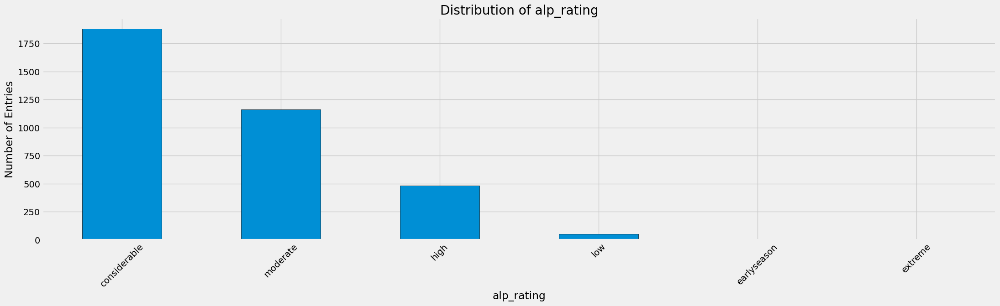

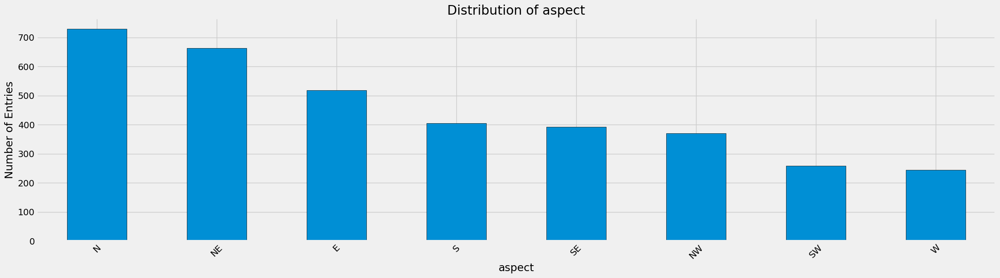

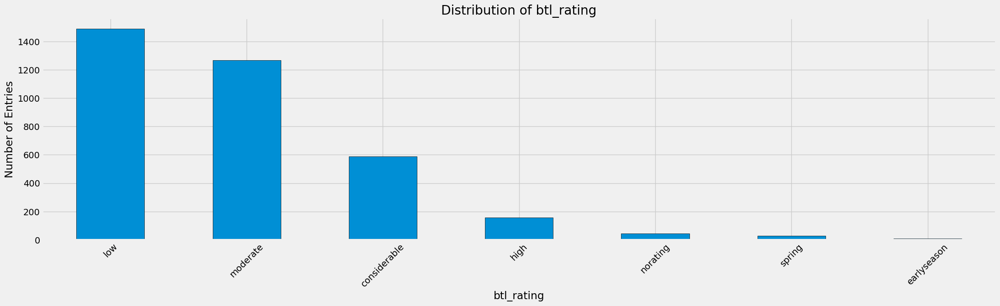

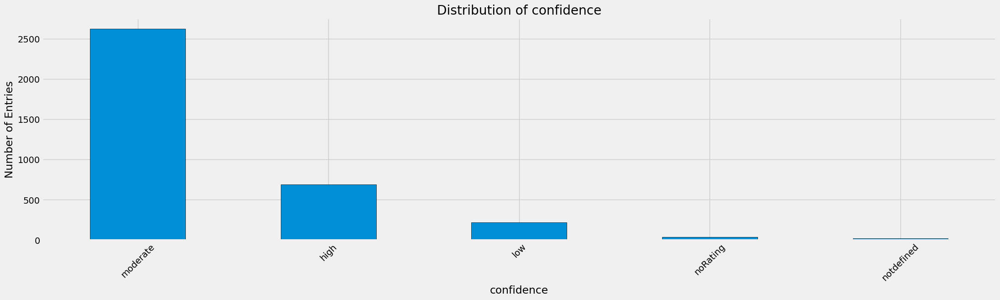

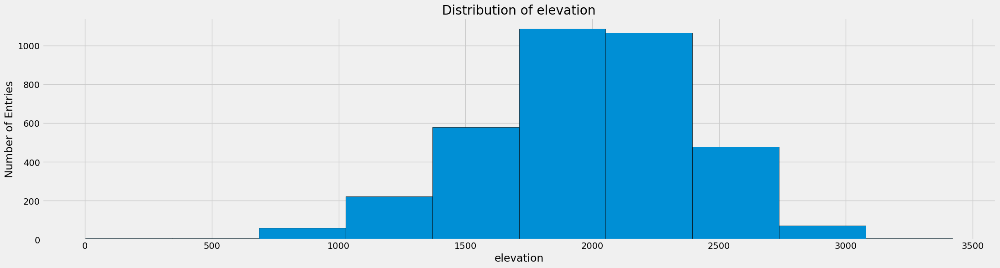

...

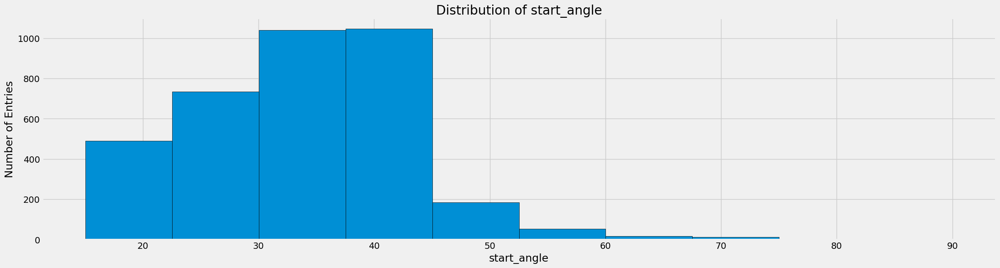

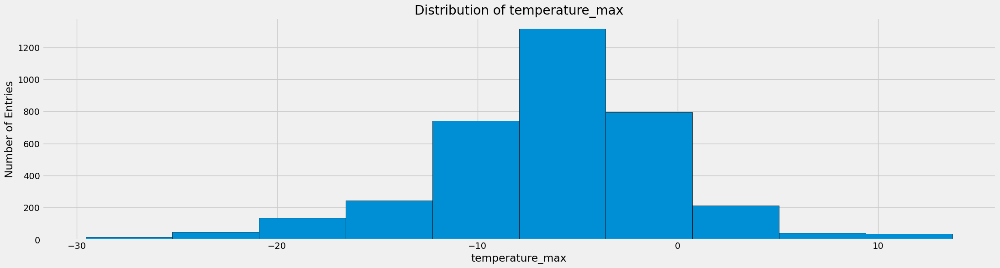

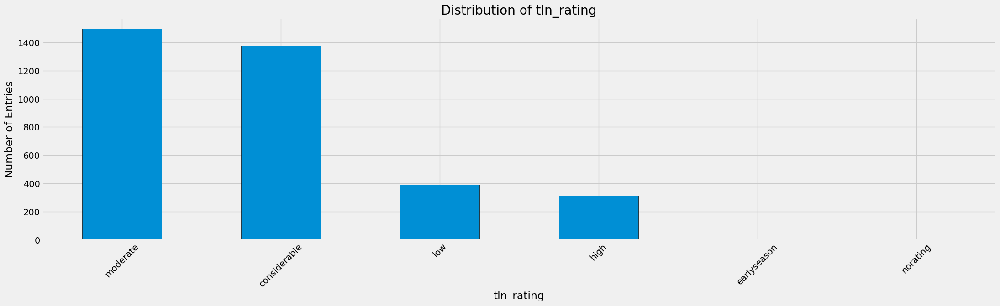

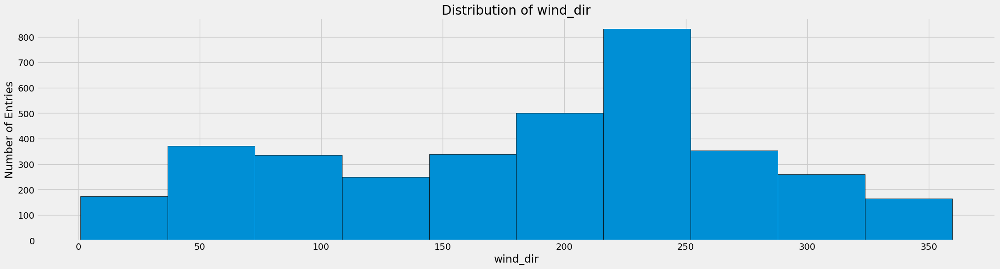

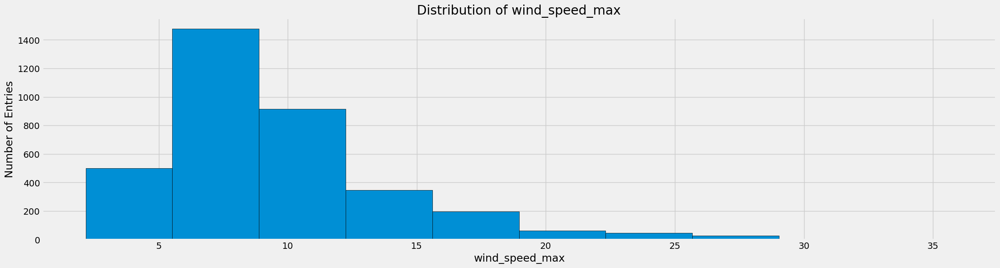

In [157]:
# List of items to exclude
exclude = ['id', 'date', 'problem_aspect', 'problem_elevaiton']

columns = df.columns.difference(exclude)


for col in columns:
    plt.figure(figsize=(24, 6))  
    if type(df[col].iloc[0]) == str:
        bar_chart(df, col)
    else: hist_chart(df, col)



**Distribution Breakdowm**

Some interesting takeaways from the distriubtions shown above
- alpine, treeline, and below treeline rating
    - The distributions change slightly between the three rating areas, but the general trend is that most avalanches occur on days when the forecast is moderate or considerable. This aligns with other findings where people are lulled into a false sense of security by a lower rating. However, due to the complicated nature of snow, these conditions are still dangerous, and many people put themselves in risky situations based on the assumption that the danger rating is lower. This is reflected in the large majority of avalanches that occur on days when the forecaster has only moderate confidence in the forecast, indicating that there are a range of factors not accounted for.
- Slope angle
    - This distribution aligns with most findings that the 30-40 degree slope angle range is the most likely to slide. Slopes that are too low lack sufficient gravitational pull, while slopes that are too steep constantly slide, preventing the snow from consolidating into a slab that could slide.
- Wind Direction
    - Predominantly out of the W/SW, which is consistent with the prevailing winds in the latitudes where the observations were recorded.
- Forecasted Problem Type
    - Storm slab and wind slab are the most common forecasted problems for days when avalanches occur. Storm slabs result from a large amount of snowfall in the previous day or days, where the weight of the snow overloads the slope and causes a slide. Wind slabs occur when extra snow is deposited by wind on a slope, also causing an overload of weight.
- Aspect
    - Most avalanches occur on N or NE slopes. This aligns with the other findings listed above. N or NE slopes are more likely to have wind slabs, as wind from the SW carries snow from the south-facing aspects over the ridge and deposits it onto the north-facing slopes.


### 2.4.2 Correlations  <a class="anchor" id="Correlations"></a>
Taking a look at the scatter plot for the numerical columns. Coloring the scatter plots by problem associated with them to see if there are noticeable trends that align with what we would expect. 

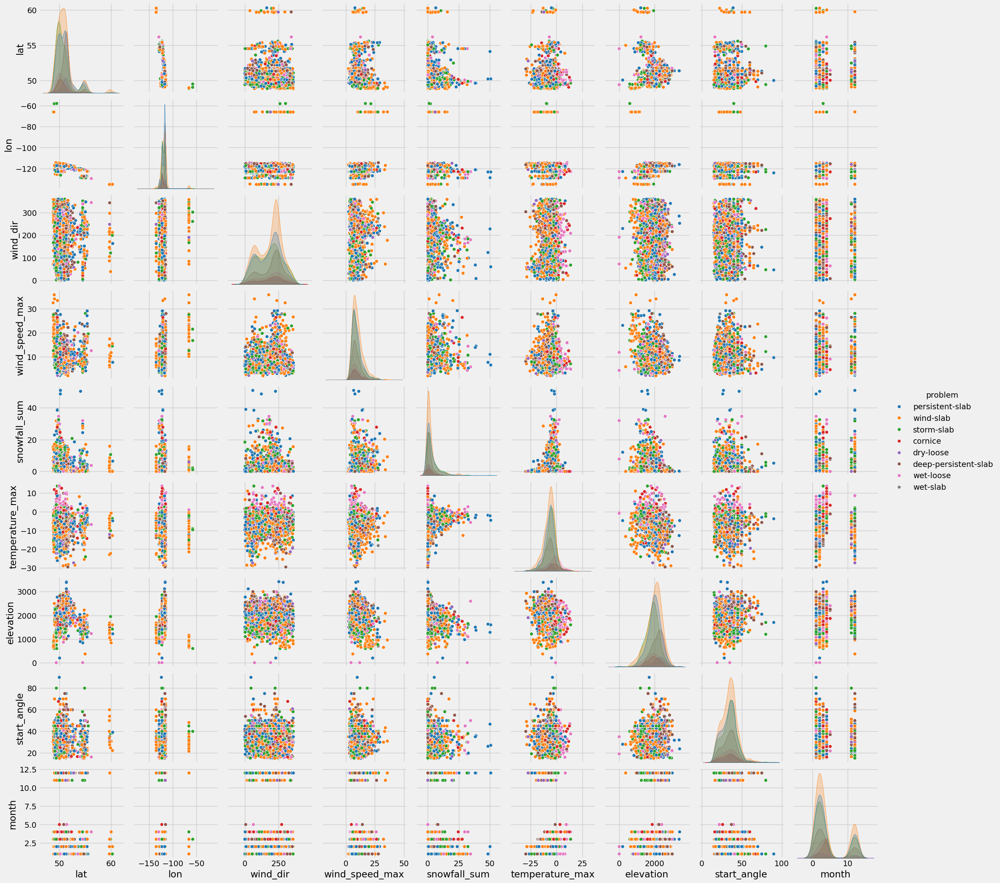

In [158]:
numerical_columns = df.select_dtypes(include=[np.number]).columns.tolist()

# Add the "problem" column to the list
columns_to_include = numerical_columns + ['problem']

# Create a new DataFrame with the selected columns
df_plot = df[columns_to_include]

sns.pairplot(df_plot, hue = 'problem',kind ='scatter', palette= 'tab10')

plt.show()


In [159]:
numerical_columns = df.select_dtypes(include=[np.number]).columns.tolist()
# Add the "problem" column to the list
columns_to_include = numerical_columns + ['problem']

# Create a new DataFrame with the selected columns
df_num = df[columns_to_include]

df_num = df_num[df_num['problem'] != 'wet-slab']

aggregations = {col: 'mean' for col in numerical_columns if col != 'month'}
aggregations['month'] = lambda x: x.mode().iloc[0] if not x.mode().empty else None

# Apply the aggregation
result = df_num.groupby('problem').agg(aggregations)

styled_df = result.style.background_gradient(subset=result.select_dtypes(include=[np.number]).columns, cmap='coolwarm')


styled_df

,lat,lon,wind_dir,wind_speed_max,snowfall_sum,temperature_max,elevation,start_angle,month
problem,,,,,,,,,
cornice,50.597113,-121.201594,194.663190,9.116060,2.836615,-1.785685,1902.223077,33.401558,4
deep-persistent-slab,51.234833,-117.898587,196.520925,9.168455,1.853464,-6.988117,2181.129330,34.584189,1
dry-loose,51.055858,-116.866008,182.858778,8.467584,1.650561,-9.005626,2207.149533,34.540165,2
persistent-slab,50.902888,-119.423023,179.735616,9.419642,3.239137,-6.937618,1992.388821,33.664314,2
storm-slab,50.606328,-120.069706,182.058017,8.980233,3.864164,-5.823546,1858.783290,34.080872,2
wet-loose,50.633172,-120.386250,199.528105,9.172837,2.792829,-0.198156,1877.121951,33.707733,3
wind-slab,50.980585,-118.353218,185.195642,10.019152,2.898013,-7.105409,1983.975719,34.358605,2


**Pairplot and table Breakdowm**
Its difficult to gather many trends from the pairplot but the table with color coordinated values gives some interesting insights

##### Slope Angle vs. Elevation

- Most avalanches are more likely to occur within a 35 degree slope angle.
- Certain avalanche problems:
  - **Wind-slabs** on days with higher winds .
  - **Persistent-slabs** occur in a range of conditions.
  - **dry-loose** and **deep-persistent-slab** Are most common at higher elevations where the most snow and colder temperatures are.
  - **cornice** Become a problem in later months of April where higher temperatures can cause them to break.

##### Snowfall vs. Wind Speed

- High snowfall **combined with strong wind speeds** may correlate with avalanche problems like **wind-slabs**.
- **storm-slab** which is the result of large amounts of snowfall occur when there has been the largest amount of snowfall that day.

##### Temperature vs. Snowfall

- **Warmer temperatures** may increase avalanche risk for certain problems, such as **wet avalanches**.
- **Colder temperatures + high snowfall** may increase the likelihood of **storm-slabs**.
- **Extremely cold** are a large indicator of **dry-loose**.

##### Lat & Lon
- As we move southwest where we have an average warmer temperatures there is a higher risk of **wet-loose** on the flip side further northeast there is a higher risk of **dry-loose** and **deep-persistent-slab**


##### Things worth noting
- It is hard to draw conclusions from wind direction as its a circular variable and mean can give a misleading interpretation


### Differencing
Differencing
Specifically, a new series is constructed where the value at the current time step is calculated 
as the difference between the original observation and the observation at the previous time step.
value(t) = observation(t) - observation(t-1)

In [160]:
# df_dif_agg = df_agg

In [161]:
#Differencing
#Specifically, a new series is constructed where the value at the current time step is calculated 
#as the difference between the original observation and the observation at the previous time step.
#value(t) = observation(t) - observation(t-1)
# df_dif = df_dif_agg.diff()

## 2.5 Data Quality Report <a class="anchor" id="Dataqualityreport"></a>
Using ProfileReport to make an interactive interface for exploring the data 

In [162]:
report = ProfileReport(df=df, title="Avalanche Data Profiling Report", explorative=True)
report.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 22/22 [00:00<00:00, 28.70it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 3. Stage Three - Data Preperation <a class="anchor" id="Datapreperation"></a>


## 3.1 Select Your Data <a class="anchor" id="Selectyourdata"></a>
Dropping Date and Forecast Region. We have extracted the month from the date column so we no longer need the chronological date. Forecast region is unneccessary as we have lat and lon which we can use to have a spatial speration.

In [163]:
x_train = df.drop(['date', 'forecast_region'], axis=1)
x_train
df['size'].unique()

array(['size-1-3_en', 'size-3-5_en', 'size-1-2_en', 'size-2-4_en',
       'size-3-6_en', 'size-1-4_en', 'size-2-5_en', 'size-1-5_en',
       'size-4-6_en', 'size-2-6_en', 'size-3-7_en', 'size-4-7_en',
       'size-3-4_en', 'size-2-7_en', 'size-4-5_en', 'size-2-3_en',
       'size-4-8_en', 'size-5-7_en'], dtype=object)

Before dropping the **id** column, we will pivot the table to handle multiple forecasted problems for a single observation. This process will condense the data into one row per observation. We achieve this by pivoting the table to create binary representations for each problem and appending the forecasting summary, hyphenated with the associated problem.



In [164]:
index_columns = ['id','lat', 'lon', 'elevation', 'start_angle', 'aspect',  'month', 'wind_speed_max', 'wind_dir', 'temperature_max','snowfall_sum', 'alp_rating', 'tln_rating', 'btl_rating', 'confidence']
pivoted_value_columns = x_train.columns.difference(['id'] + index_columns).to_list()

pivoted = x_train.pivot_table(
        index=index_columns,
        columns='problem',
        values= pivoted_value_columns + ['problem'],
        aggfunc={
        **{col: 'first' for col in pivoted_value_columns},  
        'problem': lambda x: 1 if len(x) > 0 else 0         
    }
    )

pivoted.columns = [f"{col[1]}_{col[0]}" for col in pivoted.columns]

# Reset the index to make lat and lon regular columns
pivoted = pivoted.reset_index()
pivoted

,id,lat,lon,elevation,start_angle,aspect,month,wind_speed_max,wind_dir,temperature_max,...,wet-slab_problem_elevation,wind-slab_problem_elevation,cornice_size,deep-persistent-slab_size,dry-loose_size,persistent-slab_size,storm-slab_size,wet-loose_size,wet-slab_size,wind-slab_size
0,001e654f-9f1e-4139-a81d-a92d7d6ca90c,50.698219,-118.070637,2000,35.000000,E,3,11.52560,248.8260,-7.0695,...,NaN,elevation-0-1-1_en,NaN,NaN,NaN,size-1-3_en,NaN,NaN,NaN,size-1-3_en
1,0050ee6a-684b-11ec-978d-6616bce65ccb,49.050310,-117.032530,2090,32.000000,S,12,8.82551,319.8650,-17.1225,...,NaN,NaN,NaN,NaN,NaN,size-3-5_en,size-1-3_en,NaN,NaN,NaN
2,00524098-9bf8-11eb-8831-8ada07e25eea,49.721940,-122.891990,1800,26.185454,NE,4,4.55368,232.8150,-0.0100,...,NaN,NaN,size-3-5_en,NaN,NaN,NaN,size-1-3_en,NaN,NaN,NaN
3,009aac34-0ed9-41f3-a0b1-a7cc8442499c,49.164627,-117.898849,2145,17.578167,E,2,9.65981,296.7090,-7.3790,...,NaN,elevation-0-1-1_en,NaN,NaN,NaN,NaN,NaN,NaN,NaN,size-1-2_en
4,00b27978-1072-4d6e-9ef1-c5b0476c6bd7,49.003533,-58.199195,600,40.000000,SE,3,21.48570,260.7330,-9.0645,...,NaN,NaN,NaN,NaN,NaN,NaN,size-1-3_en,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1988,ff3b5cc4-cba4-4b0b-977d-671f33048bb0,49.381340,-122.940490,1250,15.258705,N,12,6.87779,42.0156,-1.0970,...,NaN,NaN,NaN,NaN,NaN,NaN,size-1-2_en,NaN,NaN,NaN
1989,ff5a4c2a-df79-45e3-b147-1b1935354844,49.742360,-117.151790,2389,34.000000,S,12,7.78799,325.9850,-7.4810,...,NaN,elevation-0-1-1_en,NaN,size-3-5_en,NaN,NaN,NaN,NaN,NaN,size-1-3_en
1990,ff5c71ae-6c9d-43c7-9c33-151a490a2c23,49.732241,-122.897786,1400,50.000000,W,2,4.68000,252.1810,-0.3920,...,NaN,NaN,NaN,NaN,NaN,size-1-3_en,size-1-3_en,NaN,NaN,NaN
1991,ff9ca824-b87a-11ee-abff-0a58a9feac02,50.948079,-118.072255,2100,36.000000,N,1,5.31534,106.8110,-6.5455,...,NaN,NaN,NaN,NaN,NaN,size-2-4_en,size-1-3_en,NaN,NaN,NaN


## 3.2 Clean The Data <a class="anchor" id="Cleansethedata"></a>
We will need to encode a few of the categorical variables. Some are more straightforward ordinal encoding (e.g. alp/blt/tln rating ) and some will require a little more thought like Aspect which has a few options as a circular variable as well as month. Further complicated is how to encode the different forecast problem aspects and elevations.

### 3.2.1 Ordinal Encoding <a class="anchor" id="labelEncoding"></a>
Ordinal Encoding Description

Ordinal encoding is a technique used to convert categorical variables into numerical values while preserving the order or hierarchy of the categories. This is particularly useful for features where the categories have a meaningful sequence or ranking.


In [ ]:
df_encoded = pivoted.copy()


ordinal_order = {
    'alp_rating': ['low', 'moderate', 'considerable', 'high', 'extreme'],
    'tln_rating': ['low', 'moderate', 'considerable', 'high', 'extreme'],
    'btl_rating': ['norating', 'low', 'moderate', 'considerable', 'high', 'extreme'],
    'confidence': ['notdefined', 'low', 'moderate', 'high'],
   
}

likelihood = [
    'likelihood-unlikely_en',
    'likelihood-possible_unlikely_en',
    'likelihood-possible_en',
    'likelihood-likely_possible_en',
    'likelihood-likely_en',
    'likelihood-verylikely_likely_en',
    'likelihood-verylikely_en',
    'likelihood-certain_verylikely_en',
    'likelihood-certain_en'
]
   
size = [
    'size-1-2_en',
    'size-1-3_en',
    'size-2-3_en',
    'size-1-4_en',
    'size-2-4_en',
    'size-3-4_en',
    'size-1-5_en',
    'size-2-5_en',
    'size-3-5_en',
    'size-4-5_en',
    'size-1-6_en',
    'size-2-6_en',
    'size-3-6_en',
    'size-4-6_en',
    'size-1-7_en',
    'size-2-7_en',
    'size-3-7_en',
    'size-4-7_en',
    'size-5-7_en',
    'size-4-8_en'
],

size_columns = [col for col in df_encoded.columns if col.endswith('size')]
likelihood_columns = [col for col in df_encoded.columns if col.endswith('likelihood')]

ordinal_columns = df_encoded[ordinal_order.keys()]

size_encoder = OrdinalEncoder(categories=[size] * len(size_columns))
likelihood_encoder = OrdinalEncoder(categories=[likelihood] * len(likelihood_columns))
ordinal_encoder = OrdinalEncoder(categories=ordinal_columns)

ordinal_col_trans = ColumnTransformer(
    transformers=[
        ('size', size_encoder, size_columns),
        ('likelihood', likelihood_encoder, likelihood_columns),
        ('all_other', ordinal_encoder, ordinal_columns),
    ],
    remainder='passthrough'  # Keep other columns as is
)


ordinal_preprocessor = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='unknown')),  # Handle missing values
    ('ordinal_encoding', ordinal_col_trans)  # Apply ordinal encoding
])

ordinal_columns = ordinal_columns.columns.to_list() + list(size_columns) + list(likelihood_columns)
ordinal_columns

['alp_rating',
 'tln_rating',
 'btl_rating',
 'confidence',
 'cornice_size',
 'deep-persistent-slab_size',
 'dry-loose_size',
 'persistent-slab_size',
 'storm-slab_size',
 'wet-loose_size',
 'wet-slab_size',
 'wind-slab_size',
 'cornice_likelihood',
 'deep-persistent-slab_likelihood',
 'dry-loose_likelihood',
 'persistent-slab_likelihood',
 'storm-slab_likelihood',
 'wet-loose_likelihood',
 'wet-slab_likelihood',
 'wind-slab_likelihood']

### 3.2.2 Encoding Categorical columns Columns <a class="anchor" id="DropCols"></a>
Some columns are less straightforward to encode and require special consideration for encoding.

The first column type we will tackle is problem_aspect. Since it is already encoded into the variable we will convert it to binary and represent each aspect of the problem using an 1 or 0.

In [209]:

cardinal_directions = ['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW']

problem_aspect_columns = [col for col in df_encoded.columns if col.endswith('problem_aspect')]

for col in problem_aspect_columns:
    df_encoded[col] = df_encoded[col].str.replace('_en', '').str.replace('aspect-', '')

for col in problem_aspect_columns:
    # Split the string into individual bits
    binary_values = df_encoded[col].str.split('-')
    
    # Create new columns for each cardinal direction
    for i, direction in enumerate(cardinal_directions):
        new_col_name = f"{col}_{direction}"
        df_encoded[new_col_name] = binary_values.apply(lambda x: int(x[i]) if isinstance(x, list) and len(x) > i else 0)

df_encoded = df_encoded.drop(columns=problem_aspect_columns)

We will do a similar thing to elevation

In [210]:
elevations = ['btl', 'tln', 'alp']

problem_elev_columns = [col for col in df_encoded.columns if col.endswith('problem_elevation')]

for col in problem_elev_columns:
    df_encoded[col] = df_encoded[col].str.replace('elevation-', '').str.replace('_en', '')


for col in problem_elev_columns:
    # Split the string into individual bits
    binary_values = df_encoded[col].str.split('-')
    
    # Create new columns for each elev
    for i, elev in enumerate(elevations):
        new_col_name = f"{col}_{elev}"
        df_encoded[new_col_name] = binary_values.apply(lambda x: int(x[i]) if isinstance(x, list) and len(x) > i else 0)

df_encoded = df_encoded.loc[:, ~df_encoded.columns.str.endswith('_problem')].drop(columns=problem_elev_columns)

df_encoded

C:\Users\price\AppData\Local\Temp\ipykernel_11176\533103300.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_encoded[new_col_name] = binary_values.apply(lambda x: int(x[i]) if isinstance(x, list) and len(x) > i else 0)


,id,lat,lon,elevation,start_angle,aspect,month,wind_speed_max,wind_dir,temperature_max,...,storm-slab_problem_elevation_alp,wet-loose_problem_elevation_btl,wet-loose_problem_elevation_tln,wet-loose_problem_elevation_alp,wet-slab_problem_elevation_btl,wet-slab_problem_elevation_tln,wet-slab_problem_elevation_alp,wind-slab_problem_elevation_btl,wind-slab_problem_elevation_tln,wind-slab_problem_elevation_alp
0,001e654f-9f1e-4139-a81d-a92d7d6ca90c,50.698219,-118.070637,2000,35.000000,E,3,11.52560,248.8260,-7.0695,...,0,0,0,0,0,0,0,0,1,1
1,0050ee6a-684b-11ec-978d-6616bce65ccb,49.050310,-117.032530,2090,32.000000,S,12,8.82551,319.8650,-17.1225,...,1,0,0,0,0,0,0,0,0,0
2,00524098-9bf8-11eb-8831-8ada07e25eea,49.721940,-122.891990,1800,26.185454,NE,4,4.55368,232.8150,-0.0100,...,1,0,0,0,0,0,0,0,0,0
3,009aac34-0ed9-41f3-a0b1-a7cc8442499c,49.164627,-117.898849,2145,17.578167,E,2,9.65981,296.7090,-7.3790,...,0,0,0,0,0,0,0,0,1,1
4,00b27978-1072-4d6e-9ef1-c5b0476c6bd7,49.003533,-58.199195,600,40.000000,SE,3,21.48570,260.7330,-9.0645,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1988,ff3b5cc4-cba4-4b0b-977d-671f33048bb0,49.381340,-122.940490,1250,15.258705,N,12,6.87779,42.0156,-1.0970,...,1,0,0,0,0,0,0,0,0,0
1989,ff5a4c2a-df79-45e3-b147-1b1935354844,49.742360,-117.151790,2389,34.000000,S,12,7.78799,325.9850,-7.4810,...,0,0,0,0,0,0,0,0,1,1
1990,ff5c71ae-6c9d-43c7-9c33-151a490a2c23,49.732241,-122.897786,1400,50.000000,W,2,4.68000,252.1810,-0.3920,...,1,0,0,0,0,0,0,0,0,0
1991,ff9ca824-b87a-11ee-abff-0a58a9feac02,50.948079,-118.072255,2100,36.000000,N,1,5.31534,106.8110,-6.5455,...,1,0,0,0,0,0,0,0,0,0


The next goal is to encode all variables with circular values, such as aspect and months, to ensure they are represented in a way that captures their cyclical nature (e.g., months 12 and 1 being close to each other, or NE and NW being adjacent). Additionally, latitude and longitude will be represented using radius and theta to highlight their spatial distribution trends more effectively for the model.

In [211]:
def cardinal_to_sin_cos(direction):
    """
    Convert cardinal direction to its corresponding degree and calculate the sine value.

    """
    # Mapping of cardinal directions to degrees
    direction_to_degree = {
        'N': 0,
        'NE': 45,
        'E': 90,
        'SE': 135,
        'S': 180,
        'SW': 225,
        'W': 270,
        'NW': 315
    }
    
    # Get the degree value for the direction
    degree = direction_to_degree.get(direction.upper(), None)
    
    if degree is None:
        raise ValueError(f"Invalid cardinal direction: {direction}")
    
    # Convert degrees to radians
    radians = np.radians(degree)
    

    # Calculate the sine value
    return np.sin(radians), np.cos(radians)


df_encoded[['aspect_sin', 'aspect_cos']] = df_encoded['aspect'].apply(
    lambda x: cardinal_to_sin_cos(x) if isinstance(x, str) else (np.nan, np.nan)
).apply(pd.Series)

df_encoded_aspect = df_encoded.drop(columns=['aspect'])
df_encoded_aspect

,id,lat,lon,elevation,start_angle,month,wind_speed_max,wind_dir,temperature_max,snowfall_sum,...,wet-loose_problem_elevation_tln,wet-loose_problem_elevation_alp,wet-slab_problem_elevation_btl,wet-slab_problem_elevation_tln,wet-slab_problem_elevation_alp,wind-slab_problem_elevation_btl,wind-slab_problem_elevation_tln,wind-slab_problem_elevation_alp,aspect_sin,aspect_cos
0,001e654f-9f1e-4139-a81d-a92d7d6ca90c,50.698219,-118.070637,2000,35.000000,3,11.52560,248.8260,-7.0695,0.35,...,0,0,0,0,0,0,1,1,1.000000e+00,6.123234e-17
1,0050ee6a-684b-11ec-978d-6616bce65ccb,49.050310,-117.032530,2090,32.000000,12,8.82551,319.8650,-17.1225,0.28,...,0,0,0,0,0,0,0,0,1.224647e-16,-1.000000e+00
2,00524098-9bf8-11eb-8831-8ada07e25eea,49.721940,-122.891990,1800,26.185454,4,4.55368,232.8150,-0.0100,0.00,...,0,0,0,0,0,0,0,0,7.071068e-01,7.071068e-01
3,009aac34-0ed9-41f3-a0b1-a7cc8442499c,49.164627,-117.898849,2145,17.578167,2,9.65981,296.7090,-7.3790,0.00,...,0,0,0,0,0,0,1,1,1.000000e+00,6.123234e-17
4,00b27978-1072-4d6e-9ef1-c5b0476c6bd7,49.003533,-58.199195,600,40.000000,3,21.48570,260.7330,-9.0645,2.17,...,0,0,0,0,0,0,0,0,7.071068e-01,-7.071068e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1988,ff3b5cc4-cba4-4b0b-977d-671f33048bb0,49.381340,-122.940490,1250,15.258705,12,6.87779,42.0156,-1.0970,0.00,...,0,0,0,0,0,0,0,0,0.000000e+00,1.000000e+00
1989,ff5a4c2a-df79-45e3-b147-1b1935354844,49.742360,-117.151790,2389,34.000000,12,7.78799,325.9850,-7.4810,0.00,...,0,0,0,0,0,0,1,1,1.224647e-16,-1.000000e+00
1990,ff5c71ae-6c9d-43c7-9c33-151a490a2c23,49.732241,-122.897786,1400,50.000000,2,4.68000,252.1810,-0.3920,0.56,...,0,0,0,0,0,0,0,0,-1.000000e+00,-1.836970e-16
1991,ff9ca824-b87a-11ee-abff-0a58a9feac02,50.948079,-118.072255,2100,36.000000,1,5.31534,106.8110,-6.5455,3.01,...,0,0,0,0,0,0,0,0,0.000000e+00,1.000000e+00


In [ ]:
df_encoded_aspect['month_sin'] = np.sin(2 * np.pi * df_encoded_aspect['month'] / 12)
df_encoded_aspect['month_cos'] = np.cos(2 * np.pi * df_encoded_aspect['month'] / 12)
df_encoded_aspect_month = df_encoded_aspect.drop(columns=['month'])
df_encoded_aspect_month

,id,lat,lon,elevation,start_angle,wind_speed_max,wind_dir,temperature_max,snowfall_sum,alp_rating,...,wet-slab_problem_elevation_btl,wet-slab_problem_elevation_tln,wet-slab_problem_elevation_alp,wind-slab_problem_elevation_btl,wind-slab_problem_elevation_tln,wind-slab_problem_elevation_alp,aspect_sin,aspect_cos,month_sin,month_cos
0,001e654f-9f1e-4139-a81d-a92d7d6ca90c,50.698219,-118.070637,2000,35.000000,11.52560,248.8260,-7.0695,0.35,considerable,...,0,0,0,0,1,1,1.000000e+00,6.123234e-17,1.000000e+00,6.123234e-17
1,0050ee6a-684b-11ec-978d-6616bce65ccb,49.050310,-117.032530,2090,32.000000,8.82551,319.8650,-17.1225,0.28,high,...,0,0,0,0,0,0,1.224647e-16,-1.000000e+00,-2.449294e-16,1.000000e+00
2,00524098-9bf8-11eb-8831-8ada07e25eea,49.721940,-122.891990,1800,26.185454,4.55368,232.8150,-0.0100,0.00,considerable,...,0,0,0,0,0,0,7.071068e-01,7.071068e-01,8.660254e-01,-5.000000e-01
3,009aac34-0ed9-41f3-a0b1-a7cc8442499c,49.164627,-117.898849,2145,17.578167,9.65981,296.7090,-7.3790,0.00,moderate,...,0,0,0,0,1,1,1.000000e+00,6.123234e-17,8.660254e-01,5.000000e-01
4,00b27978-1072-4d6e-9ef1-c5b0476c6bd7,49.003533,-58.199195,600,40.000000,21.48570,260.7330,-9.0645,2.17,considerable,...,0,0,0,0,0,0,7.071068e-01,-7.071068e-01,1.000000e+00,6.123234e-17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1988,ff3b5cc4-cba4-4b0b-977d-671f33048bb0,49.381340,-122.940490,1250,15.258705,6.87779,42.0156,-1.0970,0.00,low,...,0,0,0,0,0,0,0.000000e+00,1.000000e+00,-2.449294e-16,1.000000e+00
1989,ff5a4c2a-df79-45e3-b147-1b1935354844,49.742360,-117.151790,2389,34.000000,7.78799,325.9850,-7.4810,0.00,moderate,...,0,0,0,0,1,1,1.224647e-16,-1.000000e+00,-2.449294e-16,1.000000e+00
1990,ff5c71ae-6c9d-43c7-9c33-151a490a2c23,49.732241,-122.897786,1400,50.000000,4.68000,252.1810,-0.3920,0.56,considerable,...,0,0,0,0,0,0,-1.000000e+00,-1.836970e-16,8.660254e-01,5.000000e-01
1991,ff9ca824-b87a-11ee-abff-0a58a9feac02,50.948079,-118.072255,2100,36.000000,5.31534,106.8110,-6.5455,3.01,considerable,...,0,0,0,0,0,0,0.000000e+00,1.000000e+00,5.000000e-01,8.660254e-01


In [212]:
#encoded radius and theta for lat and lon
df_encoded_aspect_month['radius'] = np.sqrt(df_encoded_aspect_month['lon']**2 + df_encoded_aspect_month['lat']**2)  

df_encoded_aspect_month['theta'] = np.arctan2(df_encoded_aspect_month['lat'], df_encoded_aspect_month['lon'])       

df_encoded_aspect_month_coord = df_encoded_aspect_month.drop(columns=['lat', 'lon'])  
df_encoded_aspect_month_coord

,id,elevation,start_angle,wind_speed_max,wind_dir,temperature_max,snowfall_sum,alp_rating,tln_rating,btl_rating,...,wet-slab_problem_elevation_alp,wind-slab_problem_elevation_btl,wind-slab_problem_elevation_tln,wind-slab_problem_elevation_alp,aspect_sin,aspect_cos,month_sin,month_cos,radius,theta
0,001e654f-9f1e-4139-a81d-a92d7d6ca90c,2000,35.000000,11.52560,248.8260,-7.0695,0.35,considerable,considerable,moderate,...,0,0,1,1,1.000000e+00,6.123234e-17,1.000000e+00,6.123234e-17,128.495077,2.736010
1,0050ee6a-684b-11ec-978d-6616bce65ccb,2090,32.000000,8.82551,319.8650,-17.1225,0.28,high,considerable,considerable,...,0,0,0,0,1.224647e-16,-1.000000e+00,-2.449294e-16,1.000000e+00,126.895808,2.744716
2,00524098-9bf8-11eb-8831-8ada07e25eea,1800,26.185454,4.55368,232.8150,-0.0100,0.00,considerable,considerable,moderate,...,0,0,0,0,7.071068e-01,7.071068e-01,8.660254e-01,-5.000000e-01,132.569652,2.757128
3,009aac34-0ed9-41f3-a0b1-a7cc8442499c,2145,17.578167,9.65981,296.7090,-7.3790,0.00,moderate,moderate,low,...,0,0,1,1,1.000000e+00,6.123234e-17,8.660254e-01,5.000000e-01,127.739184,2.746512
4,00b27978-1072-4d6e-9ef1-c5b0476c6bd7,600,40.000000,21.48570,260.7330,-9.0645,2.17,considerable,considerable,norating,...,0,0,0,0,7.071068e-01,-7.071068e-01,1.000000e+00,6.123234e-17,76.082143,2.441763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1988,ff3b5cc4-cba4-4b0b-977d-671f33048bb0,1250,15.258705,6.87779,42.0156,-1.0970,0.00,low,low,low,...,0,0,0,0,0.000000e+00,1.000000e+00,-2.449294e-16,1.000000e+00,132.487286,2.759649
1989,ff5a4c2a-df79-45e3-b147-1b1935354844,2389,34.000000,7.78799,325.9850,-7.4810,0.00,moderate,moderate,low,...,0,0,1,1,1.224647e-16,-1.000000e+00,-2.449294e-16,1.000000e+00,127.274680,2.740063
1990,ff5c71ae-6c9d-43c7-9c33-151a490a2c23,1400,50.000000,4.68000,252.1810,-0.3920,0.56,considerable,considerable,moderate,...,0,0,0,0,-1.000000e+00,-1.836970e-16,8.660254e-01,5.000000e-01,132.578888,2.757073
1991,ff9ca824-b87a-11ee-abff-0a58a9feac02,2100,36.000000,5.31534,106.8110,-6.5455,3.01,considerable,moderate,moderate,...,0,0,0,0,0.000000e+00,1.000000e+00,5.000000e-01,8.660254e-01,128.595350,2.734230


### 3.2.3 Numerical Encoding <a class="anchor" id="labelEncoding"></a>
Numerical Preprocessing Description

Numerical preprocessing involves preparing numerical data for machine learning models by handling missing values, scaling, and transforming the data to ensure it is in a format suitable for analysis. This step is crucial because raw numerical data may contain inconsistencies, outliers, or varying scales that can negatively impact model performance.


In [213]:
##Define numerical columns
filtered_columns = df_encoded_aspect_month_coord.columns[
    ~df_encoded_aspect_month_coord.columns.str.contains('problem_aspect|problem_elevation')
]

# Select numerical columns from the filtered columns
numerical_columns = df_encoded_aspect_month_coord[filtered_columns].select_dtypes(
    exclude=['object', 'category']
).columns


#Define Preprocessors
numeric_preprocessor = Pipeline(
    steps=[
        ("imputation_constant", SimpleImputer(strategy="constant", fill_value=0))
    ]
)

numerical_columns


Index(['elevation', 'start_angle', 'wind_speed_max', 'wind_dir',
       'temperature_max', 'snowfall_sum', 'aspect_sin', 'aspect_cos',
       'month_sin', 'month_cos', 'radius', 'theta'],
      dtype='object')

In [220]:
categorical_columns = [col for col in df_encoded_aspect_month_coord.columns if col not in list(ordinal_columns) + list(numerical_columns)]

categorical_columns.remove('id')

binary_preprocessor = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value=0))  
])

categorical_columns


['cornice_problem_aspect_N',
 'cornice_problem_aspect_NE',
 'cornice_problem_aspect_E',
 'cornice_problem_aspect_SE',
 'cornice_problem_aspect_S',
 'cornice_problem_aspect_SW',
 'cornice_problem_aspect_W',
 'cornice_problem_aspect_NW',
 'deep-persistent-slab_problem_aspect_N',
 'deep-persistent-slab_problem_aspect_NE',
 'deep-persistent-slab_problem_aspect_E',
 'deep-persistent-slab_problem_aspect_SE',
 'deep-persistent-slab_problem_aspect_S',
 'deep-persistent-slab_problem_aspect_SW',
 'deep-persistent-slab_problem_aspect_W',
 'deep-persistent-slab_problem_aspect_NW',
 'dry-loose_problem_aspect_N',
 'dry-loose_problem_aspect_NE',
 'dry-loose_problem_aspect_E',
 'dry-loose_problem_aspect_SE',
 'dry-loose_problem_aspect_S',
 'dry-loose_problem_aspect_SW',
 'dry-loose_problem_aspect_W',
 'dry-loose_problem_aspect_NW',
 'persistent-slab_problem_aspect_N',
 'persistent-slab_problem_aspect_NE',
 'persistent-slab_problem_aspect_E',
 'persistent-slab_problem_aspect_SE',
 'persistent-slab_prob

### 3.2.4 Drop Uncessary Columns <a class="anchor" id="AlteringDatatypes"></a>
This is where we drop any unnecessary columns still remaining that have not been encoded. 

In [221]:
df_final = df_encoded_aspect_month_coord.drop(columns = ['id'])



### Construct Our Primary Data Set
Join data 

In [222]:
df_final 

,elevation,start_angle,wind_speed_max,wind_dir,temperature_max,snowfall_sum,alp_rating,tln_rating,btl_rating,confidence,...,wet-slab_problem_elevation_alp,wind-slab_problem_elevation_btl,wind-slab_problem_elevation_tln,wind-slab_problem_elevation_alp,aspect_sin,aspect_cos,month_sin,month_cos,radius,theta
0,2000,35.000000,11.52560,248.8260,-7.0695,0.35,considerable,considerable,moderate,moderate,...,0,0,1,1,1.000000e+00,6.123234e-17,1.000000e+00,6.123234e-17,128.495077,2.736010
1,2090,32.000000,8.82551,319.8650,-17.1225,0.28,high,considerable,considerable,moderate,...,0,0,0,0,1.224647e-16,-1.000000e+00,-2.449294e-16,1.000000e+00,126.895808,2.744716
2,1800,26.185454,4.55368,232.8150,-0.0100,0.00,considerable,considerable,moderate,moderate,...,0,0,0,0,7.071068e-01,7.071068e-01,8.660254e-01,-5.000000e-01,132.569652,2.757128
3,2145,17.578167,9.65981,296.7090,-7.3790,0.00,moderate,moderate,low,high,...,0,0,1,1,1.000000e+00,6.123234e-17,8.660254e-01,5.000000e-01,127.739184,2.746512
4,600,40.000000,21.48570,260.7330,-9.0645,2.17,considerable,considerable,norating,moderate,...,0,0,0,0,7.071068e-01,-7.071068e-01,1.000000e+00,6.123234e-17,76.082143,2.441763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1988,1250,15.258705,6.87779,42.0156,-1.0970,0.00,low,low,low,moderate,...,0,0,0,0,0.000000e+00,1.000000e+00,-2.449294e-16,1.000000e+00,132.487286,2.759649
1989,2389,34.000000,7.78799,325.9850,-7.4810,0.00,moderate,moderate,low,low,...,0,0,1,1,1.224647e-16,-1.000000e+00,-2.449294e-16,1.000000e+00,127.274680,2.740063
1990,1400,50.000000,4.68000,252.1810,-0.3920,0.56,considerable,considerable,moderate,low,...,0,0,0,0,-1.000000e+00,-1.836970e-16,8.660254e-01,5.000000e-01,132.578888,2.757073
1991,2100,36.000000,5.31534,106.8110,-6.5455,3.01,considerable,moderate,moderate,moderate,...,0,0,0,0,0.000000e+00,1.000000e+00,5.000000e-01,8.660254e-01,128.595350,2.734230


# 4. Stage Four - Exploratory Data Analysis <a class="anchor" id="EDA"></a>

# 5. Stage Four - Modelling <a class="anchor" id="Modelling"></a>
As the first step in modelling, you'll select the actual modelling technique that you'll be using. Although you may have already selected a tool during the business understanding phase, at this stage you'll be selecting the specific modelling technique e.g. decision-tree building with C5.0, or neural network generation with back propagation. If multiple techniques are applied, perform this task separately for each technique.



## 5.1. Modelling technique <a class="anchor" id="ModellingTechnique"></a>
Document the actual modelling technique that is to be used.

Import Models below:

In [223]:
from sklearn.ensemble import IsolationForest


## 5.2. Modelling assumptions <a class="anchor" id="ModellingAssumptions"></a>
Many modelling techniques make specific assumptions about the data, for example that all attributes have uniform distributions, no missing values allowed, class attribute must be symbolic etc. Record any assumptions made.

- 
- 


## 5.3. Build Model <a class="anchor" id="BuildModel"></a>

Run the modelling tool on the prepared dataset to create one or more models.

### **Parameter Settings**

The Isolation Forest model was selected for anomaly detection due to its efficiency on high-dimensional datasets and its suitability for identifying rare or unusual instances. The following parameters were used:

- **`n_estimators = 100`**  
  *Rationale:* A moderate number of trees was chosen to ensure sufficient random partitioning without excessive computational cost.
  
- **`max_samples = 'auto'`**  
  *Rationale:* Automatically sets the number of samples to the dataset size if small, or 256 otherwise. This default behavior balances performance with speed.
  
- **`contamination = 0.0`**  
  *Rationale:* Since these are all reports of avalanches non of these would technically be outliers as their conditions did lead to an avalanche
  
- **`max_features = 1.0`**  
  *Rationale:* All features are used in splitting, ensuring no potential signal is ignored.

- **`random_state = 42`**  
  *Rationale:* Ensures reproducibility of the model results across runs.

---

### **Models**

The Isolation Forest model was trained on the full dataset after preprocessing. The model assigns an anomaly score to each data point and classifies it as either an inlier or an outlier.

---

### **Model Descriptions**

The resulting model identifies outliers based on the average path length of data points in a random tree ensemble. Shorter average path lengths indicate potential anomalies.

#### **Interpretation:**
- Points with high anomaly scores (i.e., more negative decision function values) are likely to be outliers. In this specific case outliers are conditions that are unlikely to avalanche.
- Visualizing decision scores and their distribution provided insights into the data's normal vs. anomalous patterns.
- The contamination parameter directly influenced the classification boundary, so care was taken to adjust it based on domain knowledge and validation.

#### **Difficulties Encountered:**
- **Choosing an appropriate contamination value**: Required several iterations and visual inspection.
- **Overlapping feature distributions**: Interpretation of borderline scores proved challenging.
- **Sparse or unbalanced data**: Occasionally led to over-flagging of anomalies, which was mitigated by tuning `max_samples` and `n_estimators`.

In [224]:
# choosing the model and parameters
pipeline = IsolationForest(n_estimators=100, random_state=42, contamination = 0)

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_preprocessor, numerical_columns),
        ("ord", ordinal_preprocessor, ordinal_columns),
        ("bin", binary_preprocessor, categorical_columns),
    ]
)

In [225]:
X_train, X_test = train_test_split(
    df_final, test_size=0.2, random_state=42)

X_train = preprocessor.fit_transform(X_train)


TypeError: All estimators should implement fit and transform, or can be 'drop' or 'passthrough' specifiers. '{'alp_rating': ['low', 'moderate', 'considerable', 'high', 'extreme'], 'tln_rating': ['low', 'moderate', 'considerable', 'high', 'extreme'], 'btl_rating': ['norating', 'low', 'moderate', 'considerable', 'high', 'extreme'], 'confidence': ['notdefined', 'low', 'moderate', 'high']}' (type <class 'dict'>) doesn't.

## 5.4. Assess Model <a class="anchor" id="AssessModel"></a>
Interpret the models according to your domain knowledge, your data mining success criteria and your desired test design. Judge the success of the application of modelling and discovery techniques technically, then contact business analysts and domain experts later in order to discuss the data mining results in the business context. This task only considers models, whereas the evaluation phase also takes into account all other results that were produced in the course of the project.

At this stage you should rank the models and assess them according to the evaluation criteria. You should take the business objectives and business success criteria into account as far as you can here. In most data mining projects a single technique is applied more than once and data mining results are generated with several different techniques. 

**Model assessment** - Summarise the results of this task, list the qualities of your generated models (e.g.in terms of accuracy) and rank their quality in relation to each other.

**Revised parameter settings** - According to the model assessment, revise parameter settings and tune them for the next modelling run. Iterate model building and assessment until you strongly believe that you have found the best model(s). Document all such revisions and assessments.